# Рынок заведений общественного питания Москвы

**Описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Описание данных**

*Файл moscow_places.csv:*
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    * «Средний счёт: 1000–1500 ₽»;
    * «Цена чашки капучино: 130–220 ₽»;
    * «Цена бокала пива: 400–600 ₽» и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    * 0 — заведение не является сетевым
    * 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import folium
import webbrowser
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster

### Загрузка данных и изучение общей информации

In [2]:
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Что касается типа данных, то все они представлены либо в object, либо в float64, один стоблец имеет тип - int.

In [5]:
print('Всего уникальных заведений', df['name'].nunique())

Всего уникальных заведений 5614


In [6]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

8 уникальных категорий заведений.

In [7]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Есть пропуски в следующих столбцах:'hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup' и 'seats'.

### Предобработка данных

**Явные и неявные дубликаты**

Изучим данные на наличие явных дубликатов. Спойлер: их нет.

In [8]:
df.duplicated().sum()

0

Посмотрим есть ли неявные дубликаты по адресу и названию заведения.

In [9]:
df_1 = df['name'] + df['address']
df_1

0                        WoWфлиМосква, улица Дыбенко, 7/1
1        Четыре комнатыМосква, улица Дыбенко, 36, корп. 1
2                     ХазриМосква, Клязьминская улица, 15
3       Dormouse Coffee ShopМосква, улица Маршала Федо...
4                Иль МаркоМосква, Правобережная улица, 1Б
                              ...                        
8401              Суши МанияМосква, Профсоюзная улица, 56
8402    МиславнесМосква, Пролетарский проспект, 19, ко...
8403        СамоварМосква, Люблинская улица, 112А, стр. 1
8404    Чайхана SabrМосква, Люблинская улица, 112А, ст...
8405             Kebab TimeМосква, Россошанский проезд, 6
Length: 8406, dtype: object

Приведем данные к нижнему регистру.

In [10]:
df_1 = df_1.str.lower()
df_1.duplicated().sum()

4

In [11]:
df_1[df_1.duplicated()]

215                      кафемосква, парк ангарские пруды
1511     more pokeмосква, волоколамское шоссе, 11, стр. 2
2420    раковарня клешни и хвостымосква, проспект мира...
3109           хлеб да выпечкамосква, ярцевская улица, 19
dtype: object

In [12]:
df = df.drop(index=[215, 1511, 2420, 3109])

**Пропуски**

Пропуски в столбцах 'hours', 'price', 'avg_bill', 'seats' оставляем. А 'middle_avg_bill', 'middle_coffee_cup' изучим по 'avg_bill'.

In [13]:
#df['avg_bill'].unique()

In [14]:
df[(df['middle_avg_bill'].isnull()) & (df['avg_bill'] == 'Средний счёт%')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [15]:
df[(df['middle_coffee_cup'].isnull()) & (df['avg_bill'] == 'Цена чашки%')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Нет таких строк, где бы столбец 'avg_bill' был заполнен, а среднее по нему в столбцах 'middle_avg_bill' или 'middle_coffee_cup' нет =>  'middle_avg_bill', 'middle_coffee_cup' никак не заполняем.

*Итог:* пропуски не трогаем.

Создадим **столбец street** с названиями улиц из столбца с адресом.

In [16]:
df['street'] = df['address'].str.split(', ').str[1]
df['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8402, dtype: object

Создадим **столбец is_24/7** с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [17]:
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно', case=False, na=False)

In [18]:
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


### Анализ данных

**Количество объектов общественного питания по категориям** 

Для начала посмотрим количество заведений по категориям.

In [19]:
number_of_objects = df.groupby('category')['name'].agg({'count'}).sort_values('count', ascending=False).reset_index()
number_of_objects

,category,count
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


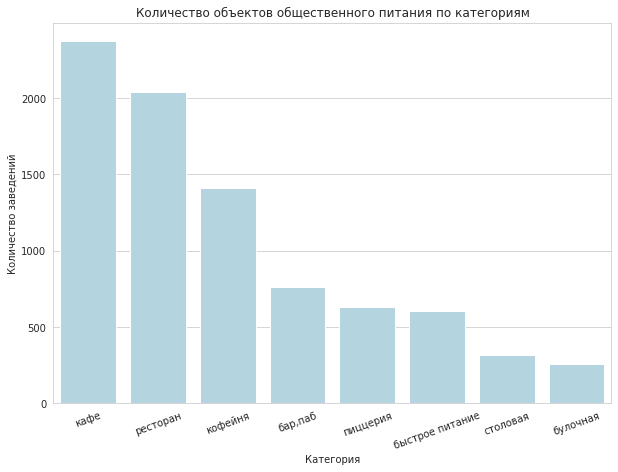

In [20]:
sns.set_style('whitegrid')
plt.figure(figsize=(10, 7))
plt.title('Количество объектов общественного питания по категориям')
plt.xticks(rotation=20) 
sns.barplot(x='category', y='count', data=number_of_objects, color='lightblue')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.show()

По графику видно, что больше всего заведений по категории 'кафе'. Также много ресторанов и кофейнь в данных, а меньше всего булочных.

Теперь посмотрим на **распределение заведений по категориям** с помощью круговой диаграммы.

In [21]:
number_of_objects['share'] = round(number_of_objects['count'] / number_of_objects['count'].sum() * 100, 3)
number_of_objects

,category,count,share
0,кафе,2376,28.279
1,ресторан,2042,24.304
2,кофейня,1413,16.817
3,"бар,паб",764,9.093
4,пиццерия,633,7.534
5,быстрое питание,603,7.177
6,столовая,315,3.749
7,булочная,256,3.047


In [22]:
name = ['Кафе', 'Ресторан', 'Кофейня', 'Бар, паб', 'Пиццерия', 'Быстрое питание', 'Столовая', 'Булочная']
fig_1 = go.Figure(data=[go.Pie(labels=name,
                             values=number_of_objects['share'], 
                             pull = [0.1, 0])])
fig_1.update_layout(title='Распределение заведений по категориям')
fig_1.show()

Большую долю на рынке занимают кафе(28,3%), около 1/4 (24,3%) - рестораны и почти 17% - кофейни. Меньше 5% рынка занимают столовые, а также булочные.

**Количество посадочных мест в местах по категориям**

Для более точного анализа посчитаем медиану посадочных мест по категориям, поскольку на количество посадочных мест в сумме влияет количество заведений.

In [23]:
median_of_seats = df.groupby('category')['seats'].agg({'median'}).sort_values('median', ascending=False).reset_index()
median_of_seats['median'] = round(median_of_seats['median'], 3)
median_of_seats['share'] = round(median_of_seats['median'] / median_of_seats['median'].sum() * 100, 3)
median_of_seats

,category,median,share
0,ресторан,86.0,15.537
1,"бар,паб",82.0,14.815
2,кофейня,80.0,14.453
3,столовая,75.5,13.640
4,быстрое питание,65.0,11.743
5,кафе,60.0,10.840
6,пиццерия,55.0,9.937
7,булочная,50.0,9.033


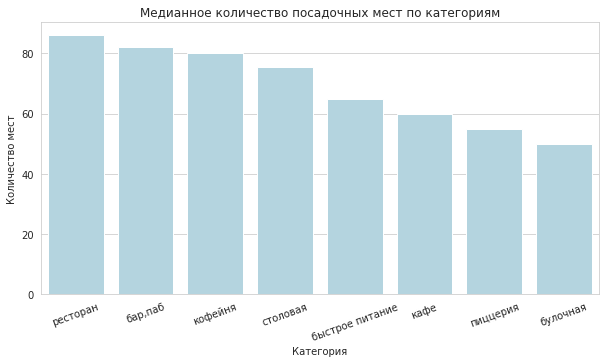

In [24]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,5))
plt.xticks(rotation=20) 
sns.barplot(data=median_of_seats, x='category', y='median', color='lightblue')
plt.title('Медианное количество посадочных мест по категориям')
plt.ylabel('Количество мест')
plt.xlabel('Категория')
plt.show()

На данном графике видно, что больше всего посадочных мест в барах, пабах, ресторанах и кофейнях.

In [25]:
name = ['Ресторан', 'Бар, паб', 'Кофейня', 'Столовая', 'Быстрое питание', 'Кафе', 'Пиццерия', 'Булочная']
fig_2 = go.Figure(data=[go.Pie(labels=name,
                             values=median_of_seats['share'], 
                             pull = [0.1, 0])])
fig_2.update_layout(title='Распределение посадочных мест по категориям')
fig_2.show()

От всего количества посадочных мест 15.5% составляют рестораны, 14.8% - бары, пабы, 14.5% - кофейни.

**Соотношение сетевых и несетевых заведений** 

In [26]:
chain = df['chain'].value_counts().reset_index()
chain

,index,chain
0,0,5199
1,1,3203


Посмотрим на соотношение сетевых и несетевых заведений с помощью круговой диаграммы.

In [27]:
chain['share'] = round(chain['chain'] / chain['chain'].sum() * 100, 3)
chain

,index,chain,share
0,0,5199,61.878
1,1,3203,38.122


In [28]:
name = ['Не сеть', 'Сеть']
fig_3 = go.Figure(data=[go.Pie(labels=name,
                             values=chain['share'], 
                             pull = [0.1, 0])])
fig_3.update_layout(title='Соотношение сетевых и несетевых заведений')
fig_3.show()

Практически 62% заведений не являются сетевыми.

**Распределение сетевых заведенй по категорям**

Чтобы понять, какие категории заведений чаще являются сетевыми, посчитаем процент сетевых от общего количества заведений каждого типа.

In [29]:
chain_yes = df[df['chain'] == 1]
chain_yes_1 = chain_yes.groupby('category')['name'].agg({'count'}).sort_values('count', ascending=False).reset_index()
chain_yes_1

,category,count
0,кафе,779
1,ресторан,729
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",168
6,булочная,157
7,столовая,88


In [30]:
category_chain = pd.merge(number_of_objects, chain_yes_1, how='left', on='category')
category_chain = category_chain.drop('share', axis=1)
category_chain = category_chain.rename(columns={'count_x': 'all_count', 'count_y': 'chain_count'})
category_chain['share'] = round(category_chain['chain_count'] / category_chain['all_count'] * 100, 3)
category_chain = category_chain.sort_values('share', ascending=False)
category_chain

,category,all_count,chain_count,share
7,булочная,256,157,61.328
4,пиццерия,633,330,52.133
2,кофейня,1413,720,50.955
5,быстрое питание,603,232,38.474
1,ресторан,2042,729,35.700
0,кафе,2376,779,32.786
6,столовая,315,88,27.937
3,"бар,паб",764,168,21.990


Видно, что больше всего сетевых заведений среди булочных, пиццерий и кофейнь.

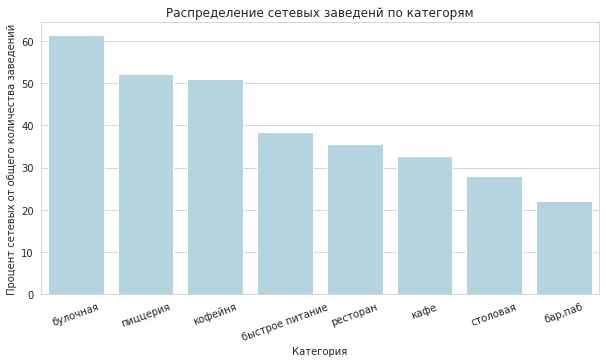

In [31]:
sns.set_style('whitegrid')
plt.figure(figsize=(10,5))
plt.xticks(rotation=20) 
sns.barplot(data=category_chain, x='category', y='share', color='lightblue')
plt.title('Распределение сетевых заведенй по категорям')
plt.ylabel('Процент сетевых от общего количества заведений')
plt.xlabel('Категория')
plt.show()

В категории "булочная" 61.3% занимают сети, в категории "пиццерия" - 52.1%, в "кофейнях" - 51%. А в категории "столовая" это значение равняется 28%, в категории "бар, паб" - 22%.

**Топ-15 популярных сетей в Москве** 

Для начала приведем все названия к нижнему регистру.

In [32]:
df['name'] = df['name'].str.lower()

In [33]:
popular_chain_yes = df[df['chain'] == 1].groupby('name')['name'].agg({'count'}).sort_values('count', ascending=False).reset_index().head(15)
popular_chain_yes

,name,count
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


Теперь построим визуализацию.

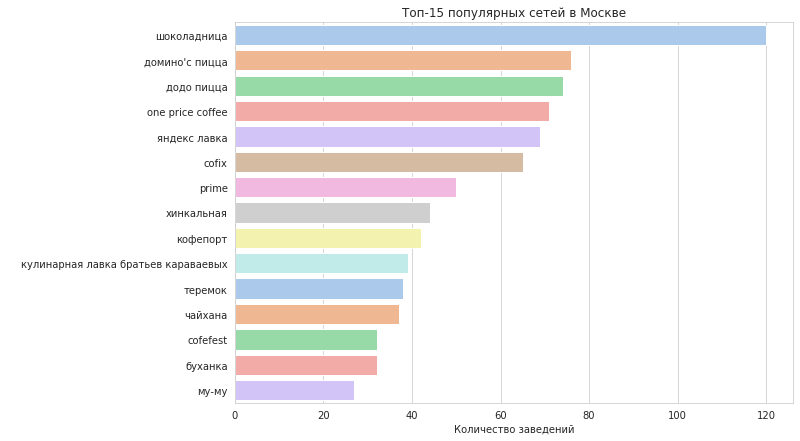

In [34]:
sns.set_style('whitegrid')
plt.figure(figsize=(10, 7))
plt.title('Топ-15 популярных сетей в Москве')
sns.barplot(x='count', y='name', data=popular_chain_yes, palette=("pastel"))
plt.xlabel('Количество заведений')
plt.ylabel(' ')
plt.show()

Шоколадница, Домино'с пицца, Додо пицца, One price coffee, Яндекс лавка, Cofix - лидеры среди сетевых общепитов.

Теперь посмотрим, к каким категориям относятся данные заведения.

In [35]:
popular_chain_categories = df.query('name in @popular_chain_yes.name').pivot_table(index='name', values='address', columns='category', aggfunc='count', margins=True).sort_values('All', ascending=False)
popular_chain_categories = popular_chain_categories.drop('All', axis = 0)
popular_chain_categories

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
name,,,,,,,,,
шоколадница,NaN,NaN,NaN,1.0,119.0,NaN,NaN,NaN,120
домино'с пицца,NaN,NaN,NaN,NaN,NaN,77.0,NaN,NaN,77
додо пицца,NaN,NaN,NaN,NaN,NaN,74.0,NaN,NaN,74
one price coffee,NaN,NaN,NaN,NaN,72.0,NaN,NaN,NaN,72
яндекс лавка,NaN,NaN,NaN,NaN,NaN,NaN,69.0,NaN,69
cofix,NaN,NaN,NaN,NaN,65.0,NaN,NaN,NaN,65
prime,NaN,NaN,NaN,1.0,NaN,NaN,49.0,NaN,50
хинкальная,3.0,NaN,6.0,19.0,NaN,NaN,15.0,1.0,44
кофепорт,NaN,NaN,NaN,NaN,42.0,NaN,NaN,NaN,42


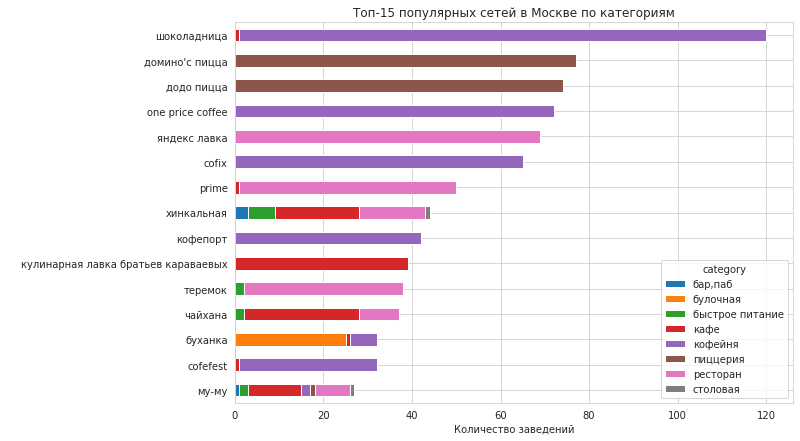

In [36]:
popular_chain_categories.sort_values('All', ascending=True).drop(['All'], axis=1).plot(kind='barh', stacked=True, figsize=(10,7))
plt.title('Топ-15 популярных сетей в Москве по категориям')
plt.xlabel('Количество заведений')
plt.ylabel(' ')
plt.show()

Топовые общепиты - общепиты категории кофейня, пиццерия и ресторан. Из интересного: Му-му, Чайхона, Хинкальная и Буханка состоят из трех и больше типов категорий. Кофейнями практически полностью являются Cofefest, Кофепорт, Cofix, One Price Coffee и Шоколадница. Ресторанами являются Теремок, Prime и Яндекс Лавка. Пиццерии - Додо Пицца и Домино'с Пицца, а кафе - Кулинарная лавка братьев Караваевых.

**Общее количество заведений и количество заведений каждой категории по районам**

In [37]:
df_district = df.groupby('district')['name'].agg({'count'})
df_district

,count
district,
Восточный административный округ,798
Западный административный округ,850
Северный административный округ,898
Северо-Восточный административный округ,890
Северо-Западный административный округ,409
Центральный административный округ,2242
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Южный административный округ,892


Для удобного восприятия информации построим визуализацию.

In [38]:
df_district_pivot = df.pivot_table(index='district', values='name', columns='category', aggfunc='count', margins=True).sort_values('All', ascending=False).reset_index()
df_district_pivot = df_district_pivot.drop(index=0)
df_district_pivot

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
1,Центральный административный округ,364,50,87,464,428,113,670,66,2242
2,Северный административный округ,68,39,58,234,193,77,188,41,898
3,Южный административный округ,68,25,85,264,131,73,202,44,892
4,Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
5,Западный административный округ,50,37,62,238,150,71,218,24,850
6,Восточный административный округ,53,25,71,272,105,72,160,40,798
7,Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
8,Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
9,Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


In [39]:
fig_4 = px.bar(df_district_pivot, x="district", y=["бар,паб",
                                                   "булочная",
                                                   "быстрое питание",
                                                   "кафе", "кофейня",
                                                   "пиццерия",
                                                   "ресторан",
                                                   "столовая"], 
               title="Количество заведений каждой категории по районам",
              labels=dict(district=' ', value='Количество', variable='Категория'))
fig_4.update_layout(
    autosize=False,
    width=900,
    height=600)
fig_4.show()

Вывод: по графику видно, что во всех округах преобладают категории "кафе", "ресторан" и "кофейня". А в ЦАО также много баров, пабов. Меньше всего заведений с такой категорией, как "булочная" и "столовая".  

**Распределение средних рейтингов по категориям заведений**

In [40]:
ratings = df.groupby('category')['rating'].agg({'mean'}).sort_values('mean', ascending=False).reset_index()
ratings['mean'] = round(ratings['mean'], 3)
ratings

,category,mean
0,"бар,паб",4.388
1,пиццерия,4.301
2,ресторан,4.290
3,кофейня,4.277
4,булочная,4.268
5,столовая,4.211
6,кафе,4.124
7,быстрое питание,4.050


In [41]:
fig_5 = px.bar(ratings, x='category', y='mean', labels=dict(category=' ', mean='Рейтинг'),
               title='Распределение средних рейтингов по категориям заведений',
              color_discrete_sequence=['lightblue'])
fig_5.update_layout(
    autosize=False,
    width=700,
    height=500,
    yaxis_range=[3.5, 5])
fig_5.show()

Построив график, можно увидеть, что средняя оценка по категориям несильно различается. Однако самый высокий рейтинг в барах, пабах - 4.38, и низкий рейтинг - в кафе(4.12) и быстром питании(4.05).

**Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района**

Для каждого округа посчитаем средний рейтинг заведений, которые находятся на его территории.

In [42]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values('rating', ascending=False)
rating_df['rating'] = round(rating_df['rating'], 3)
rating_df

,district,rating
5,Центральный административный округ,4.378
2,Северный административный округ,4.241
4,Северо-Западный административный округ,4.209
8,Южный административный округ,4.184
1,Западный административный округ,4.182
0,Восточный административный округ,4.174
7,Юго-Западный административный округ,4.173
3,Северо-Восточный административный округ,4.148
6,Юго-Восточный административный округ,4.101


In [43]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

In [44]:
m_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [45]:
folium.Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m_1)

m_1

In [46]:
m_1.save("map_1.html")
webbrowser.open("map_1.html")

False

Самый высокий средний рейтинг - в ЦАО, чуть ниже - в САО, СЗАО. Ниже всего - в ЮВАО.

**Все заведения датасета на карте с помощью кластеров средствами библиотеки folium**

In [47]:
m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [48]:
marker_cluster = MarkerCluster().add_to(m_2)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)

m_2

По кластерам видно, что меньше всего заведений в ЮАО, ЮВАО, ВАО.

**Улицы, на которых находится только один объект общепита**

In [49]:
one_object = df.pivot_table(index=['street'], values='name', aggfunc='count').reset_index().query('name == 1')
one_object

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [50]:
one_object_by_district = df.pivot_table(index=['street', 'district'], values='name', aggfunc='count').reset_index().query('name == 1')
one_object_by_district

,street,district,name
0,1-й Автозаводский проезд,Южный административный округ,1
1,1-й Балтийский переулок,Северный административный округ,1
2,1-й Варшавский проезд,Южный административный округ,1
3,1-й Вешняковский проезд,Юго-Восточный административный округ,1
5,1-й Голутвинский переулок,Центральный административный округ,1
...,...,...,...
1481,улица Шкулёва,Юго-Восточный административный округ,1
1482,улица Шкулёва 4,Юго-Восточный административный округ,1
1484,улица Шухова,Южный административный округ,1
1487,улица Юннатов,Северный административный округ,1


Улица может находится одновременно в двух районах. Проверим, есть ли у нас такой случай в данных.

In [51]:
one_object_by_district['street'].duplicated().sum()

1

In [52]:
one_object_by_district[one_object_by_district['street'].duplicated()]

,street,district,name
1256,улица Золоторожский Вал,Юго-Восточный административный округ,1


In [53]:
one_object_by_district[one_object_by_district['street'] == 'улица Золоторожский Вал']

,street,district,name
1255,улица Золоторожский Вал,Северный административный округ,1
1256,улица Золоторожский Вал,Юго-Восточный административный округ,1


Нашли! Есть одно заведение, на улице Золоторожский Вал, которое одновременно находится в двух районах по данным. НО! В реальности данная улица не может находится в двух этих районах хотя бы потому, что САО и ЮВАО - не соседи. Вывод: скорее всего здесь есть какая-то ошибка в самом названии улицы или же округа.

Посмотрим на информацию в таблице df.

In [54]:
df[df['street'] == 'улица Золоторожский Вал']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1825,you&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица Золоторожский Вал,True
5296,кафе,кафе,"Москва, улица Золоторожский Вал, 32, стр. 6",Юго-Восточный административный округ,NaN,55.749792,37.680520,3.3,NaN,NaN,NaN,NaN,0,NaN,улица Золоторожский Вал,False


Посмотрев, в каком округе находится адрес кофейни you&coffee, выяснилось, что она находится на самом деле в ЮВАО. Упс, ошибочка!

Сгруппируем данные по району и посмотрим в каких районах есть много улиц, на которых находится только один объект общепита.

In [55]:
one_object_by_district_sum = one_object_by_district.groupby('district')['name'].count().to_frame().sort_values('name', ascending=False).reset_index()
one_object_by_district_sum

,district,name
0,Центральный административный округ,148
1,Северо-Восточный административный округ,56
2,Северный административный округ,54
3,Восточный административный округ,52
4,Южный административный округ,50
5,Юго-Восточный административный округ,42
6,Западный административный округ,36
7,Северо-Западный административный округ,21
8,Юго-Западный административный округ,18


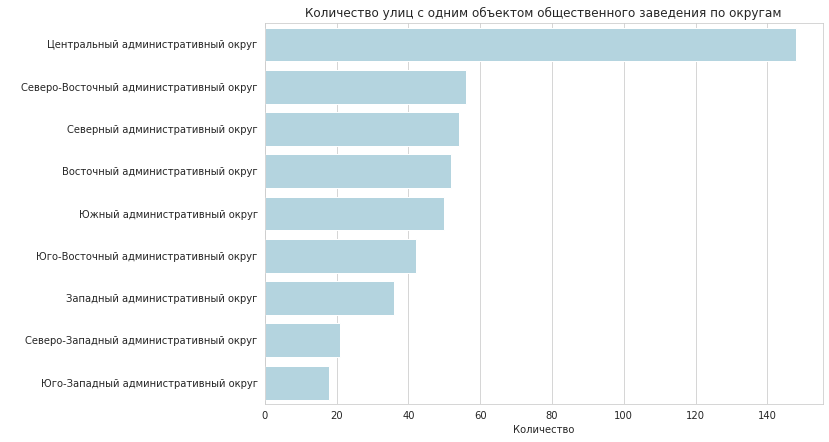

In [56]:
sns.set_style('whitegrid')
plt.figure(figsize=(10, 7))
plt.title('Количество улиц с одним объектом общественного заведения по округам') 
sns.barplot(x='name', y='district', data=one_object_by_district_sum, color='lightblue')
plt.xlabel('Количество')
plt.ylabel(' ')
plt.show()

Больше всего улиц с одним заведением в ЦАО, что интересно. В СВАО, втором округе по количеству таких улиц, значение меньше - в 2,5 раза. И меньше всего улиц с одним общепитом - в ЮЗАО.

**Медианный чек заведений по округам**

In [57]:
middle_avg_bill_district = df.groupby('district')['middle_avg_bill'].median().to_frame().sort_values('middle_avg_bill', ascending=False).reset_index()
middle_avg_bill_district

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [58]:
m_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [59]:
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по округам',
).add_to(m_3)
m_3

Дороже всего можно поесть - в ЗАО и ЦАО. Дешевле всего - в ЮАО, ЮВАО и СВАО.

**Общий вывод анализа данных:**

- Большую долю на рынке занимают кафе(28,3%), около 1/4 (24,3%) - рестораны и почти 17% - кофейни. Меньше 5% рынка занимают столовые, а также булочные.

- Больше всего посадочных мест в барах, пабах, ресторанах и кофейнях. От всего количества посадочных мест 15.5% составляют рестораны, 14.8% - бары, пабы, 14.5% - кофейни.

- 38% заведений являются сетевыми. В категории "булочная" 61.3% занимают сети, в категории "пиццерия" - 52.1%, в "кофейнях" - 51%. А в категории "столовая" это значение равняется 28%, в категории "бар, паб" - 22%.

- Шоколадница, Домино'с пицца, Додо пицца, One price coffee, Яндекс лавка, Cofix - лидеры среди сетевых общепитов. Они входят в категории кофейнь, пиццерий и ресторанов. Му-му, Чайхона, Хинкальная и Буханка состоят из трех и больше типов категорий. Кофейнями практически полностью являются Cofefest, Кофепорт, Cofix, One Price Coffee и Шоколадница. Ресторанами являются Теремок, Prime и Яндекс Лавка. Пиццерии - Додо Пицца и Домино'с Пицца, а кафе - Кулинарная лавка братьев Караваевых.

- Во всех округах преобладают категории "кафе", "ресторан" и "кофейня". А в ЦАО также много баров, пабов. Меньше всего заведений с такой категорией, как "булочная" и "столовая".

- Средняя оценка по категориям несильно различается. Однако самый высокий рейтинг в барах, пабах - 4.38, и низкий рейтинг - в кафе(4.12) и быстром питании(4.05).

- По округам самый высокий средний рейтинг - в ЦАО, чуть ниже - в САО, СЗАО. Ниже всего - в ЮВАО. меньше всего заведений в ЮАО, ЮВАО, ВАО. 

- По ходу анализа был найдена ошибка в данных: кофейня you&coffee по изначальным данным находилась в САО, хотя по адресу она - в ЮВАО . 

- Выше всего медианный чек- в ЗАО и ЦАО, ниже всего - в ЮАО, ЮВАО и СВАО

- Больше всего улиц с одним заведением в ЦАО, что интересно. В СВАО, втором округе по количеству таких улиц, значение меньше - в 2,5 раза. И меньше всего улиц с одним общепитом - в ЮЗАО.

### Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [60]:
print('Всего кофеен в Москве:', df[df['category'] == 'кофейня']['name'].count())

Всего кофеен в Москве: 1413


In [61]:
coffee_house = df[df['category'] == 'кофейня']

In [62]:
coffee_house_ditrict = coffee_house.groupby('district')['name'].agg({'count'}).sort_values('count', ascending=False).reset_index()
coffee_house_ditrict

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Построим визуализацию.

In [63]:
m_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [64]:
Choropleth(
    geo_data=state_geo,
    data=coffee_house_ditrict,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен по районам',
).add_to(m_4)
m_4

Больше всего кофеен в ЦАО, меньше всего - в ВАО, ЮЗАО, ЮВАО и СЗАО. 

In [65]:
m_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [66]:
marker_cluster = MarkerCluster().add_to(m_5)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee_house.apply(create_clusters, axis=1)

m_5


Особенности расположения: неудивительно, что больше всего кофейнь в центре города. Чем ближе к МКАДу, тем меньше плотность заведений этой категории.

Есть ли круглосуточные кофейни?

In [67]:
coffee_house[coffee_house['is_24/7'] == True]['name'].count()

59

Круглосуточных кофеен немного: скорее всего из-за формата заведения.

In [68]:
coffee_house_24 = coffee_house[coffee_house['is_24/7'] == True]

In [69]:
coffee_house24_ditrict = coffee_house_24.groupby('district')['name'].count().to_frame().sort_values('name', ascending=False).reset_index()
coffee_house24_ditrict

,district,name
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


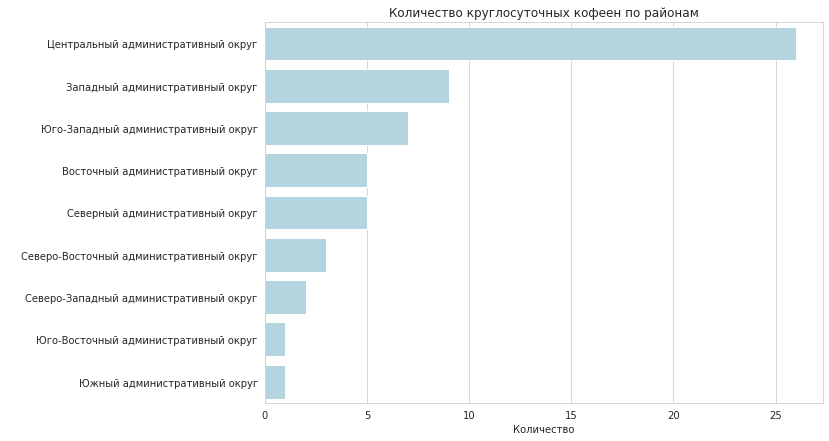

In [70]:
sns.set_style('whitegrid')
plt.figure(figsize=(10, 7))
plt.title('Количество круглосуточных кофеен по районам')
sns.barplot(x='name', y='district', data=coffee_house24_ditrict, color='lightblue')
plt.xlabel('Количество')
plt.ylabel(' ')
plt.show()

Какие у кофеен рейтинги? Как они распределяются по районам?

In [71]:
ratings = df.groupby('category')['rating'].agg({'mean'}).sort_values('mean', ascending=False).reset_index()
ratings['mean'] = round(ratings['mean'], 3)
ratings

,category,mean
0,"бар,паб",4.388
1,пиццерия,4.301
2,ресторан,4.290
3,кофейня,4.277
4,булочная,4.268
5,столовая,4.211
6,кафе,4.124
7,быстрое питание,4.050


In [72]:
rating_coffee_house = coffee_house.groupby('district')['rating'].agg({'mean'}).sort_values('mean', ascending=False).reset_index()
rating_coffee_house['mean'] = round(rating_coffee_house['mean'], 3)
rating_coffee_house

,district,mean
0,Центральный административный округ,4.336
1,Северо-Западный административный округ,4.326
2,Северный административный округ,4.292
3,Юго-Западный административный округ,4.283
4,Восточный административный округ,4.283
5,Южный административный округ,4.233
6,Юго-Восточный административный округ,4.226
7,Северо-Восточный административный округ,4.217
8,Западный административный округ,4.195


In [73]:
fig_6 = px.bar(rating_coffee_house, x='district', y='mean',
               labels=dict(district=' ', mean='Рейтинг'),
               color_discrete_sequence=['lightblue'], 
              title='Средний рейтинг по округам')
fig_6.update_layout(
    autosize=False,
    width=800,
    height=500,
    yaxis_range=[4, 4.5])
fig_6.show()

Здесь для визуалицизации достаточно столбчатой диаграммы, поскольку только в ЦАО средний рейтинг немного выше, чем в остальных округах(4.336). В остальных округах рейтинг плюс-минус такой же(4.2-4.3)

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Для того, чтобы ответить на данный вопрос, найдем медиану по столбцу 'middle_coffee_cup'.

In [74]:
coffee_house_middle_coffee_cup = coffee_house.groupby('district')['middle_coffee_cup'].median().to_frame().sort_values('middle_coffee_cup', ascending=False).reset_index()
coffee_house_middle_coffee_cup

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


Также построим визуализацию.

In [75]:
fig_7 = px.bar(coffee_house_middle_coffee_cup, x='district', y='middle_coffee_cup',
               labels=dict(district=' ', middle_coffee_cup='Стоимость чашки капучино'),
               color_discrete_sequence=['lightblue'], 
              title='Медианная стоимость чашки капучино по округам')
fig_7.update_layout(
    autosize=False,
    width=800,
    height=500)
fig_7.show()

Стоимость одной чашки капучино зависит от раойна в котором кофейня будет находится. Так в ЮЗАО медианная цена одной чашки составляет 198 рублей. В данном районе самая высокая стоимость.

In [76]:
df_2 = pd.merge(coffee_house_ditrict, rating_coffee_house, how='left', on='district')
df_2 = pd.merge(df_2, coffee_house_middle_coffee_cup, how='left', on='district')
df_2

,district,count,mean,middle_coffee_cup
0,Центральный административный округ,428,4.336,190.0
1,Северный административный округ,193,4.292,159.0
2,Северо-Восточный административный округ,159,4.217,162.5
3,Западный административный округ,150,4.195,189.0
4,Южный административный округ,131,4.233,150.0
5,Восточный административный округ,105,4.283,135.0
6,Юго-Западный административный округ,96,4.283,198.0
7,Юго-Восточный административный округ,89,4.226,147.5
8,Северо-Западный административный округ,62,4.326,165.0


<AxesSubplot:>

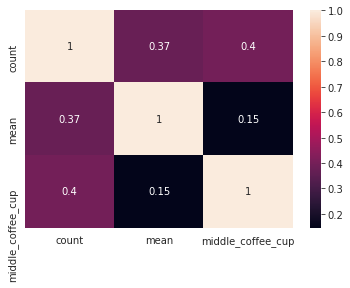

In [77]:
sns.heatmap(df_2.corr(), annot = True)

Построив хитмэп, можно сказать, что стоимость чашки капучино больше зависит от количества заведений в округе(0.4), нежели от рейтинга. Хотя зависимость и слабая, но она присутствует. То есть, чем больше заведений в округе, тем выше стоимость одной чашки. А от рейтинга цена чашки практически не зависит(0.15). Можно также отметить зависимость рейтинга от количества заведений в округе (0.37). Это легко можно объяснить конкурентностью. Чем больше заведений в одном районе, тем выше конкурентность между ними. Соотвественно, эти заведения улучшают качество, чтобы привлечь больше посетителей, откуда у заведений более высокий рейтинг. 

**Рекомендации**

Поскольку кофейня только открывается, следует опираться на среднюю цену по округу, в котором будет находится кофейня. Плюс, как сказано в задаче, цель основателей фонда «Shut Up and Take My Money» - доступность новой кофейни. Поэтому цена одной чашки капучино должна примерно варьироваться от 198 до 135 рублей в зависимости от округа.
Безусловно, для более высокой цены чашки капучино стоит выбирать округ с наибольшей плотностью кофеен. Стоит рассмотреть юг ЦАО и север ЮАО, или ЮЗАО. Там плотность кофеен не слишком высокая, что говорит о не очень большом количество конкурентов, но и не слишком низкая, то есть можно будет установить цену в районе 150 руб. Однако все же надо обращать внимание на стоимость аренды помещения.

### Презентация

https://disk.yandex.ru/i/mR_ad1pAl5aoxw